Imports and neccessary functions from previous labs

In [1]:
# Imports
import matplotlib.pyplot as plt
import multiprocessing
import pandas as pd
import numpy as np
import string
import timeit
import time
import re

from multiprocessing import Pool
from nltk.tokenize import word_tokenize
from ordered_set import OrderedSet
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer

In [2]:
# Functions from hand on 1
def get_and_clean_data():
    data = pd.read_csv('../Week 1/resource/software_developer_united_states_1971_20191023_1.csv')
    description = data['job_description']
    cleaned_description = description.apply(lambda s: s.translate(str.maketrans('', '', string.punctuation + u'\xa0')))
    cleaned_description = cleaned_description.apply(lambda s: s.lower())
    cleaned_description = cleaned_description.apply(lambda s: s.translate(str.maketrans(string.whitespace, ' '*len(string.whitespace), '')))
    cleaned_description = cleaned_description.drop_duplicates()
    return cleaned_description

def simple_tokenize(data):
    cleaned_description = data.apply(lambda s: [x.strip() for x in s.split()])
    return cleaned_description

def parse_job_description():
    cleaned_description = get_and_clean_data()
    cleaned_description = simple_tokenize(cleaned_description)
    return cleaned_description

We'll be processing the data just like from hand on's

In [3]:
# With 1000 rows limit
start_time = time.perf_counter() # start timer
cleaned_description = get_and_clean_data()[:1000]

# Replace non alphabets with spaces, and collapse spaces
cleaned_description = cleaned_description.apply(lambda s: re.sub(r'[^A-Za-z]', ' ', s))
cleaned_description = cleaned_description.apply(lambda s: re.sub(r'\s+', ' ', s))

# Tokenize
tokenized_description = cleaned_description.apply(lambda s: word_tokenize(s))

# Remove stop words
stop_dict = set(stopwords.words())
sw_removed_description = tokenized_description.apply(lambda s: list(OrderedSet(s) - stop_dict))
sw_removed_description = sw_removed_description.apply(lambda s: [word for word in s if len(word)>2])

# Create stem caches
concated = np.unique(np.concatenate([s for s in tokenized_description.values]))
stem_cache = {}
ps = PorterStemmer()
for s in concated:
    stem_cache[s] = ps.stem(s)

# Stem
limited_stemmed_description = sw_removed_description.apply(lambda s: [stem_cache[w] for w in s])

# End timer
end_time = time.perf_counter()

time_limited = end_time - start_time

In [4]:
# With full data
start_time = time.perf_counter() # start timer
cleaned_description = get_and_clean_data() # removed this limit

# Replace non alphabets with spaces, and collapse spaces
cleaned_description = cleaned_description.apply(lambda s: re.sub(r'[^A-Za-z]', ' ', s))
cleaned_description = cleaned_description.apply(lambda s: re.sub(r'\s+', ' ', s))

# Tokenize
tokenized_description = cleaned_description.apply(lambda s: word_tokenize(s))

# Remove stop words
stop_dict = set(stopwords.words())
sw_removed_description = tokenized_description.apply(lambda s: list(OrderedSet(s) - stop_dict))
sw_removed_description = sw_removed_description.apply(lambda s: [word for word in s if len(word)>2])

# Create stem caches
concated = np.unique(np.concatenate([s for s in tokenized_description.values]))
stem_cache = {}
ps = PorterStemmer()
for s in concated:
    stem_cache[s] = ps.stem(s)

# Stem
stemmed_description = sw_removed_description.apply(lambda s: [stem_cache[w] for w in s])

# End timer
end_time = time.perf_counter()

time_full = end_time - start_time

In [5]:
# Time comparison for stemming
print(f"Execution time (1000 rows limit): {time_limited:.4f} seconds")
print(f"Execution time (full data): {time_full:.4f} seconds")

Execution time (1000 rows limit): 10.2787 seconds
Execution time (full data): 33.9519 seconds


In [6]:
# LIMITED DATA SIZE
from sklearn.feature_extraction.text import CountVectorizer
start_time = time.perf_counter() # start timer

cv = CountVectorizer(analyzer=lambda s: s)
vectorizer = cv.fit(limited_stemmed_description)
X = vectorizer.transform(limited_stemmed_description)
print(pd.DataFrame(X.toarray(), columns=cv.get_feature_names_out()).head(10).to_markdown())

# End timer
end_time = time.perf_counter()

time_limited = end_time - start_time

|    |   aa |   aaa |   aadairstrategicstaffcom |   aaeeo |   aampt |   aapeeo |   aau |   ab |   abap |   abapworkflow |   abc |   aberdeen |   abet |   abid |   abil |   abreast |   abroad |   absenc |   absolut |   absorb |   abstract |   abus |   academ |   academi |   academia |   acap |   acatalyst |   acceler |   acceleromet |   accelri |   accentur |   accept |   acceptancereject |   acceptedmetapro |   accesibilityflextronicscom |   access |   accesscontrol |   accid |   accident |   accolad |   accolit |   accommod |   accommodationaerotek |   accommodationteksystem |   accomplish |   accord |   account |   accredit |   accrual |   accumul |   accumulo |   accur |   accuraci |   accurev |   ace |   acet |   acfr |   ach |   achiev |   aci |   acknowledg |   acm |   acoust |   acqu |   acquir |   acquisit |   acr |   acrobat |   act |   action |   actionequ |   actionori |   actipro |   activ |   activatecr |   activemq |   activex |   actix |   actor |   actorusecas |   actua

In [7]:
# FULL DATA SIZE
start_time = time.perf_counter() # start timer

cv = CountVectorizer(analyzer=lambda s: s)
vectorizer = cv.fit(stemmed_description)
X = vectorizer.transform(stemmed_description)
print(pd.DataFrame(X.toarray(), columns=cv.get_feature_names_out()).head(10).to_markdown())

# End timer
end_time = time.perf_counter()

time_full = end_time - start_time

|    |   aa |   aaa |   aaacad |   aac |   aachen |   aad |   aadairstrategicstaffcom |   aae |   aaeeo |   aaeoe |   aaeoohsuedu |   aaf |   aah |   aamfdv |   aamfveterandis |   aampt |   aanalyz |   aapeeo |   aar |   aaron |   aarp |   aasa |   aastat |   aau |   aaudiovideo |   ab |   aba |   abacusnext |   abafadc |   abap |   abapworkflow |   abat |   abb |   abbott |   abbrevi |   abbtech |   abc |   abca |   abcmous |   abcmousecom |   abcoa |   abd |   abe |   abeeb |   abend |   abercrombi |   aberdeen |   abet |   abetaccredit |   abf |   abfc |   abhishek |   abi |   abid |   abil |   abilen |   abilities |   abilitiesabout |   abilitiesadv |   abilitiesbusi |   abilitiescombin |   abilitiesdemonstr |   abilitiesemail |   abilitiesprimari |   abilitiesrequir |   abilitiy |   ability |   abilitydesir |   abilityeduc |   abilityor |   abilityto |   abilitywork |   abingdon |   abinitio |   abintio |   abiom |   abl |   ablewil |   abloy |   abnorm |   aboard |   aboettcherap

In [8]:
# Time comparison for count vectorizer
print(f"Execution time (1000 rows limit): {time_limited:.4f} seconds")
print(f"Execution time (full data): {time_full:.4f} seconds")

Execution time (1000 rows limit): 1.0681 seconds
Execution time (full data): 4.7552 seconds


---
**Page 70** : Quick exercise
- Create an equivalent frequency table (producing the same output as
CountVectorizer) by modifying the code used to generate the binary table in
the previous chapter.
- Then show that the two tables are equivalent.


In [9]:
# LIMITED DATA SIZE
start_time = time.perf_counter() # start timer
all_terms = [[term] for term in cv.get_feature_names_out()]

query_map = pd.DataFrame(
    [
        [1 if np.all([term in doc for term in comb]) else 0 for comb in all_terms]
        for doc in limited_stemmed_description  # Set here for limited size
    ],
    columns=[' '.join(comb) for comb in all_terms]
)

# End timer
end_time = time.perf_counter()

time_limited = end_time - start_time

In [10]:
# FULL DATA SIZE
start_time = time.perf_counter() # start timer
# (codes from hand on)
# Extract Columns from the new code
all_terms = [[term] for term in cv.get_feature_names_out()]

# Old code
# Modified query_map creation: Check if each term is in the document (without splitting)
query_map = pd.DataFrame(
    [
        [1 if np.all([term in doc for term in comb]) else 0 for comb in all_terms]  # Check if term exists in doc
        for doc in stemmed_description  # Iterate over each document (already tokenized)
    ],
    columns=[' '.join(comb) for comb in all_terms]
)
# End timer
end_time = time.perf_counter()

time_full = end_time - start_time

In [11]:
# Showing the table
print(query_map.head(10).to_markdown())

|    |   aa |   aaa |   aaacad |   aac |   aachen |   aad |   aadairstrategicstaffcom |   aae |   aaeeo |   aaeoe |   aaeoohsuedu |   aaf |   aah |   aamfdv |   aamfveterandis |   aampt |   aanalyz |   aapeeo |   aar |   aaron |   aarp |   aasa |   aastat |   aau |   aaudiovideo |   ab |   aba |   abacusnext |   abafadc |   abap |   abapworkflow |   abat |   abb |   abbott |   abbrevi |   abbtech |   abc |   abca |   abcmous |   abcmousecom |   abcoa |   abd |   abe |   abeeb |   abend |   abercrombi |   aberdeen |   abet |   abetaccredit |   abf |   abfc |   abhishek |   abi |   abid |   abil |   abilen |   abilities |   abilitiesabout |   abilitiesadv |   abilitiesbusi |   abilitiescombin |   abilitiesdemonstr |   abilitiesemail |   abilitiesprimari |   abilitiesrequir |   abilitiy |   ability |   abilitydesir |   abilityeduc |   abilityor |   abilityto |   abilitywork |   abingdon |   abinitio |   abintio |   abiom |   abl |   ablewil |   abloy |   abnorm |   aboard |   aboettcherap

In [12]:
# Time comparison for list operation
print(f"Execution time (1000 rows limit): {time_limited:.4f} seconds")
print(f"Execution time (full data): {time_full:.4f} seconds")

Execution time (1000 rows limit): 217.5569 seconds
Execution time (full data): 1749.9850 seconds


---
- Page 74, 75 (Hand_out 2) : Activity — performance benchmark 
    - `Set operations vs list operation in stemming`

In [13]:
# (Given)
def set_operation(sample_size):
    cleaned_description = get_and_clean_data()[:sample_size]

    #replace non alphabets with spaces, and collapse spaces
    cleaned_description = cleaned_description.apply(lambda s: re.sub(r'[^A-Za-z]', ' ', s))
    cleaned_description = cleaned_description.apply(lambda s: re.sub(r'\s+', ' ', s))

    #tokenize
    tokenized_description = cleaned_description.apply(lambda s: word_tokenize(s))

    #remove stop words
    stop_dict = set(stopwords.words())
    sw_removed_description = tokenized_description.apply(lambda s: list(OrderedSet(s) - stop_dict))
    sw_removed_description = sw_removed_description.apply(lambda s: [word for word in s if len(word)>2])

    #create stem caches
    concated = np.unique(np.concatenate([s for s in tokenized_description.values]))
    stem_cache = {}
    ps = PorterStemmer()
    for s in concated:
        stem_cache[s] = ps.stem(s)

    #stem
    stemmed_description = sw_removed_description.apply(lambda s: [stem_cache[w] for w in s])

    return stemmed_description

def list_operation(sample_size):
    cleaned_description = get_and_clean_data()[:sample_size]

    #replace non alphabets with spaces, and collapse spaces
    cleaned_description = cleaned_description.apply(lambda s: re.sub(r'[^A-Za-z]', ' ', s))
    cleaned_description = cleaned_description.apply(lambda s: re.sub(r'\s+', ' ', s))

    #tokenize
    tokenized_description = cleaned_description.apply(lambda s: word_tokenize(s))

    #remove stop words
    stop_dict = list(stopwords.words())
    sw_removed_description = tokenized_description.apply(lambda s: [word for word in s if word not in stop_dict])
    sw_removed_description = sw_removed_description.apply(lambda s: [word for word in s if len(word)>2])

    #create stem caches
    concated = np.unique(np.concatenate([s for s in tokenized_description.values]))
    stem_cache = {}
    ps = PorterStemmer()
    for s in concated:
        stem_cache[s] = ps.stem(s)

    #stem
    stemmed_description = sw_removed_description.apply(lambda s: [stem_cache[w] for w in s])

    return stemmed_description


Starting from here is where the experiments and comparisons comes in

In [14]:
# Setting up for the limited 1000 rows data iteration <<
limited_data = get_and_clean_data()[:1000]
limited_data_size = len(limited_data)
limited_iteration_size = 500

# Benchmark
limited_t_set = []
limited_t_list = []
for i in range(limited_iteration_size, limited_data_size+1, limited_iteration_size):
    limited_t_set.append(timeit.timeit(lambda: set_operation(i), number=1))
    limited_t_list.append(timeit.timeit(lambda: list_operation(i), number=1))

In [15]:
# Setting up for the full size data iteration <<
data = get_and_clean_data()
data_size = len(data)
iteration_size = 500

# Benchmark
t_set = []
t_list = []
for i in range(iteration_size, data_size+1, iteration_size):
    t_set.append(timeit.timeit(lambda: set_operation(i), number=1))
    t_list.append(timeit.timeit(lambda: list_operation(i), number=1))

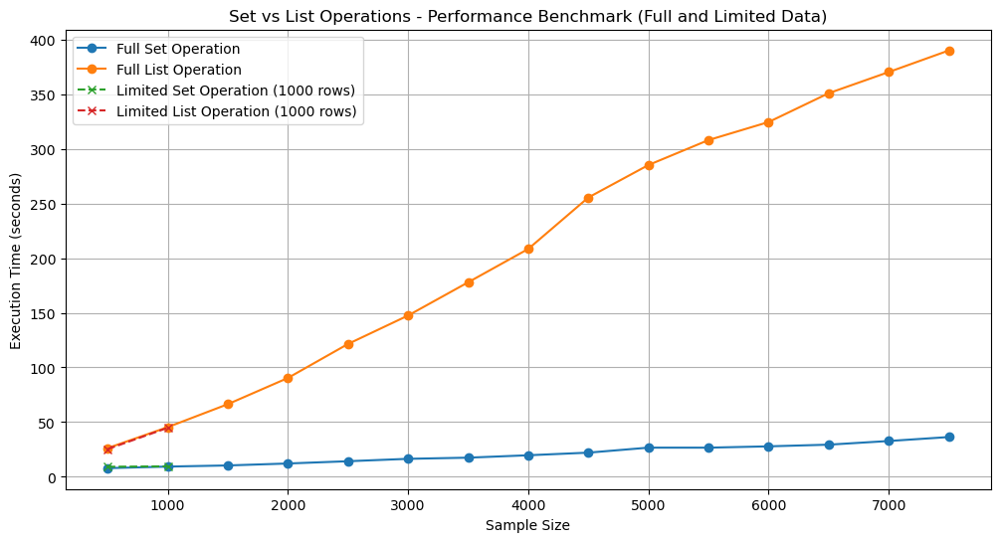

In [16]:
# Plotting
plt.figure(figsize=(12, 6))

# Plot full data results
plt.plot(range(iteration_size, data_size+1, iteration_size), t_set, label='Full Set Operation', marker='o')
plt.plot(range(iteration_size, data_size+1, iteration_size), t_list, label='Full List Operation', marker='o')

# Plot limited data results
plt.plot(range(limited_iteration_size, limited_data_size+1, limited_iteration_size), limited_t_set, label='Limited Set Operation (1000 rows)', linestyle='--', marker='x')
plt.plot(range(limited_iteration_size, limited_data_size+1, limited_iteration_size), limited_t_list, label='Limited List Operation (1000 rows)', linestyle='--', marker='x')

# Formatting the plot
plt.xlabel('Sample Size')
plt.ylabel('Execution Time (seconds)')
plt.title('Set vs List Operations - Performance Benchmark (Full and Limited Data)')
plt.legend()
plt.grid(True)

plt.show()


Next is experiments with Multiprocessing to work on stemming

---
- Page 76 `handout 2` : Multiprocessing

In [17]:
# Setup for the experiment
def better_set_operation(cleaned_description):
    #replace non alphabets with spaces, and collapse spaces
    cleaned_description = cleaned_description.apply(lambda s: re.sub(r'[^A-Za-z]', ' ', s))
    cleaned_description = cleaned_description.apply(lambda s: re.sub(r'\s+', ' ', s))

    #tokenize
    tokenized_description = cleaned_description.apply(lambda s: word_tokenize(s))

    #remove stop words
    stop_dict = set(stopwords.words())
    sw_removed_description = tokenized_description.apply(lambda s: list(OrderedSet(s) - stop_dict))
    sw_removed_description = sw_removed_description.apply(lambda s: [word for word in s if len(word)>2])

    #create stem caches
    concated = np.unique(np.concatenate([s for s in tokenized_description.values]))
    stem_cache = {}
    ps = PorterStemmer()
    for s in concated:
        stem_cache[s] = ps.stem(s)

    #stem
    stemmed_description = sw_removed_description.apply(lambda s: [stem_cache[w] for w in s])

    return stemmed_description

In [18]:
# Limited data to 1000 rows
cleaned_description = get_and_clean_data()[:1000]

limited_core_exp = {}

for c in [1,2,4,8,12]:
    # 1, 2, 4, 8, ...
    start = time.time()
    print(f"Running: {c} core(s)")
    
    parsed_description_split = np.array_split(cleaned_description, c)
    with multiprocessing.pool.ThreadPool(c) as pool:
        pool.map(better_set_operation, parsed_description_split)
    
    end = time.time()
    limited_core_exp[c] = end - start


Running: 1 core(s)


c:\Users\Admin\anaconda3\envs\SE-IR\Lib\site-packages\numpy\core\fromnumeric.py:59: FutureWarning: 'Series.swapaxes' is deprecated and will be removed in a future version. Please use 'Series.transpose' instead.
  return bound(*args, **kwds)


Running: 2 core(s)
Running: 4 core(s)
Running: 8 core(s)
Running: 12 core(s)


In [19]:
# Full data (this was from hand on)
cleaned_description = get_and_clean_data()

core_exp = {}

for c in [1,2,4,8,12]:
    # 1, 2, 4, 8, ...
    start = time.time()
    print(f"Running: {c} core(s)")
    
    parsed_description_split = np.array_split(cleaned_description, c)
    with multiprocessing.pool.ThreadPool(c) as pool:
        pool.map(better_set_operation, parsed_description_split)
    
    end = time.time()
    core_exp[c] = end - start


Running: 1 core(s)


c:\Users\Admin\anaconda3\envs\SE-IR\Lib\site-packages\numpy\core\fromnumeric.py:59: FutureWarning: 'Series.swapaxes' is deprecated and will be removed in a future version. Please use 'Series.transpose' instead.
  return bound(*args, **kwds)


Running: 2 core(s)
Running: 4 core(s)
Running: 8 core(s)
Running: 12 core(s)


In [20]:
core_exp

{1: 27.480472564697266,
 2: 23.67040205001831,
 4: 23.940125703811646,
 8: 23.50851559638977,
 12: 23.155911922454834}

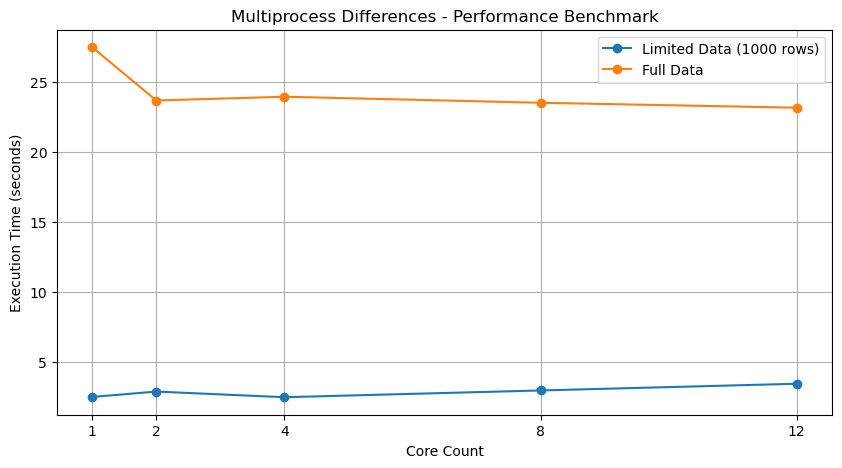

In [25]:
# Plotting the performance benchmark for multiprocessing with limited and full datasets
plt.figure(figsize=(10, 5))  # Set the figure size

# Plot limited core experiments
plt.plot(
    list(limited_core_exp.keys()),  # x-axis: core counts 
    list(limited_core_exp.values()),  # y-axis: execution times
    marker='o',
    label='Limited Data (1000 rows)'
)

# Plot full core experiments
plt.plot(
    list(core_exp.keys()),  # x-axis: 
    list(core_exp.values()),  # y-axis:
    marker='o',
    label='Full Data'
)

# Formatting
plt.xlabel('Core Count')
plt.ylabel('Execution Time (seconds)')
plt.title('Multiprocess Differences - Performance Benchmark')
plt.xticks(list(core_exp.keys()))
plt.grid(True)
plt.legend()
plt.show()


---
- page 78 `handout 2` : speedup time

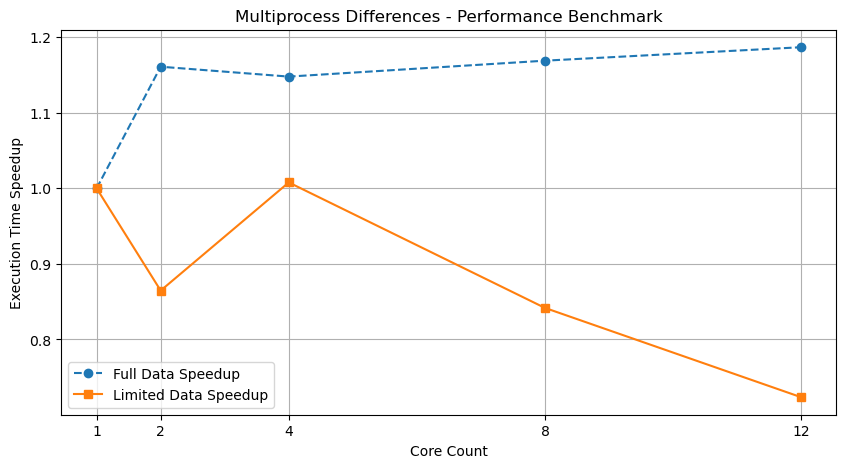

In [26]:
# Calculate Speedup for each core count (full data and limited data)
speedup = {c: core_exp[1] / time for c, time in core_exp.items()}
limited_speedup = {c: limited_core_exp[1] / time for c, time in limited_core_exp.items()}

# Plotting
plt.figure(figsize=(10, 5))

# Plot full data speedup
plt.plot(
    list(speedup.keys()), 
    list(speedup.values()), 
    marker='o', linestyle='--', label='Full Data Speedup'
)

# Plot limited data speedup
plt.plot(
    list(limited_speedup.keys()), 
    list(limited_speedup.values()), 
    marker='s', linestyle='-', label='Limited Data Speedup'
)

plt.xlabel('Core Count')
plt.ylabel('Execution Time Speedup')
plt.title('Multiprocess Differences - Performance Benchmark')
plt.xticks(list(core_exp.keys()))  # Ensure x-axis matches available core counts
plt.legend()
plt.grid(True)
plt.show()
